In [2]:
import os
import math
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import seaborn as sn
from pandas.plotting import scatter_matrix
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
from sklearn.preprocessing import LabelEncoder
import lightgbm as lgb
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import KFold
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier ,VotingClassifier
from sklearn.metrics import (confusion_matrix, precision_recall_curve, auc,
                             roc_curve, recall_score, classification_report, f1_score,
                             precision_recall_fscore_support, roc_auc_score)
from sklearn.preprocessing import LabelEncoder
import category_encoders as ce
%matplotlib inline

C:\Users\LENOVO\Anaconda3\lib\site-packages\dask\config.py:168: YAMLLoadWarning:

calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.

C:\Users\LENOVO\Anaconda3\lib\site-packages\distributed\config.py:20: YAMLLoadWarning:

calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.



In [3]:
## en cliquant sur exécuter ou en appuyant sur Ma + Entrée) listera tous les fichiers dans le répertoire d'entrée
for dirname, _, filenames in os.walk('D:/Jeu de données/Widsdatathon2020'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

D:/Jeu de données/Widsdatathon2020\samplesubmission.csv
D:/Jeu de données/Widsdatathon2020\solution_template.csv
D:/Jeu de données/Widsdatathon2020\training_v2.csv
D:/Jeu de données/Widsdatathon2020\unlabeled.csv
D:/Jeu de données/Widsdatathon2020\WiDS Datathon 2020 Dictionary.csv
D:/Jeu de données/Widsdatathon2020\widsdatathon2020.zip


In [4]:
df = pd.read_csv('D:/Jeu de données/Widsdatathon2020/training_v2.csv')
df

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.730000,0,Caucasian,M,180.3,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.420000,0,Caucasian,F,160.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,119783,50777,118,0,25.0,31.950000,0,Caucasian,F,172.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,79267,46918,118,0,81.0,22.640000,1,Caucasian,F,165.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,92056,34377,33,0,19.0,NaN,0,Caucasian,M,188.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma
5,33181,74489,83,0,67.0,27.560000,0,Caucasian,M,190.5,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic
6,82208,49526,83,0,59.0,57.450000,0,Caucasian,F,165.1,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
7,120995,50129,33,0,70.0,NaN,0,Caucasian,M,165.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Sepsis,Cardiovascular
8,80471,10577,118,1,45.0,NaN,0,Caucasian,M,170.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
9,42871,90749,118,0,50.0,25.710000,0,NaN,M,175.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular


In [279]:
# Number of missing values in the data
df = df[df.columns[0:20]]
df.isna().sum()

encounter_id                 0
patient_id                   0
hospital_id                  0
hospital_death               0
age                       4228
bmi                       3429
elective_surgery             0
ethnicity                 1395
gender                      25
height                    1334
hospital_admit_source    21409
icu_admit_source           112
icu_id                       0
icu_stay_type                0
icu_type                     0
pre_icu_los_days             0
readmission_status           0
weight                    2720
albumin_apache           54379
apache_2_diagnosis        1662
dtype: int64

Déposez les valeurs au-dessus d'un certain seuil

Si les informations contenues dans la variable ne sont pas si élevées, vous pouvez supprimer la variable si elle a plus de 50% de valeurs manquantes.Dans cette méthode, nous supprimons les colonnes avec des valeurs nulles au-dessus d'un certain seuil

In [280]:
# Train missing values (in percent)
train_missing = (df.isnull().sum() / len(df)).sort_values(ascending = False)
train_missing.head()
train_missing = train_missing.index[train_missing > 0.50]
print('There are %d columns with more than 50%% missing values' % len(train_missing))

There are 1 columns with more than 50% missing values


In [281]:
# Train missing values (in percent)
train_missing = (df.isna().sum() / len(df)).sort_values(ascending = False)
train_missing.head()
train_missing = train_missing.index[train_missing > 0.50]
print('There are %d columns with more than 50%% NaN values' % len(train_missing))

There are 1 columns with more than 50% NaN values


In [282]:
# Drop columns based on threshold limit
threshold = len(df) * 0.60
df=df.dropna(axis=1, thresh=threshold)
# View columns in the dataset
df

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,apache_2_diagnosis
0,66154,25312,118,0,68.0,22.730000,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.541667,0,73.9,113.0
1,114252,59342,81,0,77.0,27.420000,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.927778,0,70.2,108.0
2,119783,50777,118,0,25.0,31.950000,0,Caucasian,F,172.7,Emergency Department,Accident & Emergency,93,admit,Med-Surg ICU,0.000694,0,95.3,122.0
3,79267,46918,118,0,81.0,22.640000,1,Caucasian,F,165.1,Operating Room,Operating Room / Recovery,92,admit,CTICU,0.000694,0,61.7,203.0
4,92056,34377,33,0,19.0,NaN,0,Caucasian,M,188.0,NaN,Accident & Emergency,91,admit,Med-Surg ICU,0.073611,0,NaN,119.0
5,33181,74489,83,0,67.0,27.560000,0,Caucasian,M,190.5,Direct Admit,Accident & Emergency,95,admit,Med-Surg ICU,0.000694,0,100.0,301.0
6,82208,49526,83,0,59.0,57.450000,0,Caucasian,F,165.1,Operating Room,Accident & Emergency,95,admit,Med-Surg ICU,0.000694,0,156.6,108.0
7,120995,50129,33,0,70.0,NaN,0,Caucasian,M,165.0,Emergency Department,Accident & Emergency,91,admit,Med-Surg ICU,0.002083,0,NaN,113.0
8,80471,10577,118,1,45.0,NaN,0,Caucasian,M,170.2,Other Hospital,Other Hospital,114,admit,CCU-CTICU,0.009028,0,NaN,116.0
9,42871,90749,118,0,50.0,25.710000,0,NaN,M,175.3,Direct Admit,Accident & Emergency,114,admit,CCU-CTICU,0.060417,0,79.0,112.0


## Remplacer les valeurs en utilisant la moyenne, mediane et mode

Les valeurs nulles sont remplacées par la moyenne / median.mode dans cette méthode. Il s'agit de la méthode statistique de traitement des valeurs nulles. La moyenne des données de la colonne numérique est utilisée pour remplacer les valeurs nulles lorsque les données sont normalement distribuées. La médiane est utilisée si les données comprennent des valeurs aberrantes. Le mode est utilisé lorsque les données ayant plus d'occurrences d'une valeur particulière ou une valeur plus fréquente.

In [283]:
impute_df = df[['age','bmi','height']]
mean_age = impute_df['age'].mean()
median_bmi = impute_df['bmi'].median()
mean_height = impute_df['height'].mean()

In [284]:
impute_df.isna().sum()

age       4228
bmi       3429
height    1334
dtype: int64

In [285]:
# Replace Null Values (np.nan) with mean
df['age'] = df['age'].fillna((df['age'].mean()))
df['bmi'] = df['bmi'].fillna((df['bmi'].median()))
df['height'] = df['height'].fillna((df['height'].mean()))

In [286]:
df['age'] = df['age'].apply(np.int64)
df['height'] = df['height'].apply(np.int64)

In [287]:
df

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,apache_2_diagnosis
0,66154,25312,118,0,68,22.730000,0,Caucasian,M,180,Floor,Floor,92,admit,CTICU,0.541667,0,73.9,113.0
1,114252,59342,81,0,77,27.420000,0,Caucasian,F,160,Floor,Floor,90,admit,Med-Surg ICU,0.927778,0,70.2,108.0
2,119783,50777,118,0,25,31.950000,0,Caucasian,F,172,Emergency Department,Accident & Emergency,93,admit,Med-Surg ICU,0.000694,0,95.3,122.0
3,79267,46918,118,0,81,22.640000,1,Caucasian,F,165,Operating Room,Operating Room / Recovery,92,admit,CTICU,0.000694,0,61.7,203.0
4,92056,34377,33,0,19,27.654655,0,Caucasian,M,188,NaN,Accident & Emergency,91,admit,Med-Surg ICU,0.073611,0,NaN,119.0
5,33181,74489,83,0,67,27.560000,0,Caucasian,M,190,Direct Admit,Accident & Emergency,95,admit,Med-Surg ICU,0.000694,0,100.0,301.0
6,82208,49526,83,0,59,57.450000,0,Caucasian,F,165,Operating Room,Accident & Emergency,95,admit,Med-Surg ICU,0.000694,0,156.6,108.0
7,120995,50129,33,0,70,27.654655,0,Caucasian,M,165,Emergency Department,Accident & Emergency,91,admit,Med-Surg ICU,0.002083,0,NaN,113.0
8,80471,10577,118,1,45,27.654655,0,Caucasian,M,170,Other Hospital,Other Hospital,114,admit,CCU-CTICU,0.009028,0,NaN,116.0
9,42871,90749,118,0,50,25.710000,0,NaN,M,175,Direct Admit,Accident & Emergency,114,admit,CCU-CTICU,0.060417,0,79.0,112.0


In [288]:
fill_df = df[['gender','ethnicity']]
fill_df.isna().sum()

gender         25
ethnicity    1395
dtype: int64

In [289]:
#backward fill
df['gender'] = df['gender'].bfill()
# Forward fill
df['ethnicity'] = df['ethnicity'].ffill()

In [290]:
df.head()

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,apache_2_diagnosis
0,66154,25312,118,0,68,22.730000,0,Caucasian,M,180,Floor,Floor,92,admit,CTICU,0.541667,0,73.9,113.0
1,114252,59342,81,0,77,27.420000,0,Caucasian,F,160,Floor,Floor,90,admit,Med-Surg ICU,0.927778,0,70.2,108.0
2,119783,50777,118,0,25,31.950000,0,Caucasian,F,172,Emergency Department,Accident & Emergency,93,admit,Med-Surg ICU,0.000694,0,95.3,122.0
3,79267,46918,118,0,81,22.640000,1,Caucasian,F,165,Operating Room,Operating Room / Recovery,92,admit,CTICU,0.000694,0,61.7,203.0
4,92056,34377,33,0,19,27.654655,0,Caucasian,M,188,NaN,Accident & Emergency,91,admit,Med-Surg ICU,0.073611,0,NaN,119.0


In [291]:
fill_df = df[['gender','ethnicity']]
fill_df.isna().sum()

gender       0
ethnicity    0
dtype: int64

In [292]:
## Supprimer toutes les lignes contenant des valeurs manquantes
print("Orginal shape before dropna()" ,df.shape)
df = df.dropna()

Orginal shape before dropna() (91713, 19)


# Visualisation des données

In [579]:
#labels
lab = df["hospital_death"].value_counts().keys().tolist()
#values
val = df["hospital_death"].value_counts().values.tolist()
trace = go.Pie(labels=lab, 
                values=val, 
                marker=dict(colors=['Orange']), 
                # Seting values to 
                hoverinfo="value"
              )
data = [trace]

layout = go.Layout(title="Hospital Death Distribution")
fig = go.Figure(data = data,layout = layout)
fig.show()

In [580]:
#labels
lab = df["hospital_admit_source"].value_counts().keys().tolist()
#values
val = df["hospital_admit_source"].value_counts().values.tolist()
trace = go.Pie(labels=lab, 
                values=val, 
                marker=dict(colors=['Pink']), 
                # Seting values to 
                hoverinfo="value"
              )
data = [trace]

layout = go.Layout(title="Hospital Admit Source")
fig = go.Figure(data = data,layout = layout)
fig.show()

In [583]:
trace = go.Histogram(x=df['age'],nbinsx=50,histnorm='percent')
data = [trace]
# defining layout
layout = go.Layout(title="Age Distribution")
# defining figure and plotting
fig = go.Figure(data = data,layout = layout)
fig.show()

### Distribution de l'age(hommes et femmes) des patients

In [5]:
import plotly.express as px
fig = px.histogram(df[['age','gender','hospital_death','bmi']].dropna(), x="age", y="hospital_death", color="gender",
                   marginal="box", # or violin, rug
                   hover_data=df[['age','gender','hospital_death','bmi']].columns)
fig.show()

### Décès moyen à l'hôpital

In [294]:
age_death_F=df[df['gender']=='F'][['age','hospital_death']].groupby('age').mean().reset_index()
age_death_M=df[df['gender']=='M'][['age','hospital_death']].groupby('age').mean().reset_index()
from plotly.subplots import make_subplots
fig = make_subplots()
fig.add_trace(
    go.Scatter(x=age_death_F['age'], y=age_death_F['hospital_death'], name="Female patients"))
fig.add_trace(
    go.Scatter(x=age_death_M['age'], y=age_death_M['hospital_death'],name="Male patients"))
fig.update_layout(
    title_text="<b>Probabilité moyenne de décès à l'hôpital des patients<b>")
fig.update_xaxes(title_text="<b>patient age<b>")
fig.update_yaxes(title_text="<b>Décés Moyen à l'hopital</b>", secondary_y=False)
fig.show()

### Impact de l'IMB et du poids sur les patients 

In [295]:
weight_df=df[['weight','hospital_death','bmi']]
weight_df['weight']=weight_df['weight'].round(0)
weight_df['bmi']=weight_df['bmi'].round(0)
weight_death=weight_df[['weight','hospital_death']].groupby('weight').mean().reset_index()
bmi_death=weight_df[['bmi','hospital_death']].groupby('bmi').mean().reset_index()
fig = make_subplots(rows=1, cols=2, shared_yaxes=True)
fig.add_trace(
    go.Scatter(x=weight_death['weight'], y=weight_death['hospital_death'], name="Weight"),
   row=1, col=1
)
fig.add_trace(
    go.Scatter(x=bmi_death['bmi'], y=bmi_death['hospital_death'], name="BMI"),
    row=1, col=2
)
fig.update_layout(
    title_text="<b> Impact de l'IMB et du poids sur les patients<b>"
)
fig.update_yaxes(title_text="<b>Average Hospital Death")
fig.show()
50


50

In [296]:
ICU_type=df[['icu_type','age','hospital_death']]
ICU_type['icu_type']=ICU_type['icu_type'].replace({'CTICU':'CCU-CTICU',
                                              'Cardiac ICU':'CCT-CTICU',
                                              'CTICU':'CCT-CTICU',
                                              'CSICU':'SICU'})
#ICU_type['pre_icu_los_days']=ICU_type['pre_icu_los_days'].round(0)
ICU_df=ICU_type.groupby(['icu_type','age']).mean().reset_index()
ICU_df['count']=ICU_type.groupby(['icu_type','age']).count().reset_index()['hospital_death']

fig = px.scatter(ICU_df, x="age", y="hospital_death", size="count", color="icu_type",
           hover_name="icu_type", log_x=False, size_max=60,)
fig.update_layout(
    title_text="<b>Taux de survie à différents types de soins intensifs<b>"
)
fig.update_yaxes(title_text="<b>Average Hospital Death<b>")
fig.update_xaxes(title_text="<b>Age<b>")
fig.show()

In [297]:
ICU_day=df[df['pre_icu_los_days']>=0][['icu_type','pre_icu_los_days','hospital_death']]
ICU_day['icu_type']=ICU_type['icu_type'].replace({'CTICU':'CCU-CTICU',
                                              'Cardiac ICU':'CCT-CTICU',
                                              'CTICU':'CCT-CTICU',
                                              'CSICU':'SICU'})
ICU_day['pre_icu_los_days']=ICU_day['pre_icu_los_days'].round(0)
ICU_df=ICU_day.groupby(['icu_type','pre_icu_los_days']).mean().reset_index()
ICU_df['count']=ICU_day.groupby(['icu_type','pre_icu_los_days']).sum().reset_index()['hospital_death']

fig = px.scatter(ICU_df, x="pre_icu_los_days", y="hospital_death", size="count", color="icu_type",
           hover_name="icu_type", log_x=True, size_max=200,)
fig.update_layout(
    title_text="<b>Taux de survie à différentes durées de séjour avant l'admission en USI<b>"
)
fig.update_yaxes(title_text="<b>Average Hospital Death<b>")
fig.update_xaxes(title_text="<b>The length of stay of the patient between hospital admission and unit admission <b>")
fig.show()

### Quelle est la relation entre la catégorisation du système corporel apache et la mort à l'hôpital

# Selection des caractéristiques

In [298]:
df

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,apache_2_diagnosis
0,66154,25312,118,0,68,22.730000,0,Caucasian,M,180,Floor,Floor,92,admit,CTICU,0.541667,0,73.90,113.0
1,114252,59342,81,0,77,27.420000,0,Caucasian,F,160,Floor,Floor,90,admit,Med-Surg ICU,0.927778,0,70.20,108.0
2,119783,50777,118,0,25,31.950000,0,Caucasian,F,172,Emergency Department,Accident & Emergency,93,admit,Med-Surg ICU,0.000694,0,95.30,122.0
3,79267,46918,118,0,81,22.640000,1,Caucasian,F,165,Operating Room,Operating Room / Recovery,92,admit,CTICU,0.000694,0,61.70,203.0
5,33181,74489,83,0,67,27.560000,0,Caucasian,M,190,Direct Admit,Accident & Emergency,95,admit,Med-Surg ICU,0.000694,0,100.00,301.0
6,82208,49526,83,0,59,57.450000,0,Caucasian,F,165,Operating Room,Accident & Emergency,95,admit,Med-Surg ICU,0.000694,0,156.60,108.0
9,42871,90749,118,0,50,25.710000,0,Caucasian,M,175,Direct Admit,Accident & Emergency,114,admit,CCU-CTICU,0.060417,0,79.00,112.0
10,105427,125898,77,0,72,28.257052,1,Hispanic,F,154,Operating Room,Operating Room / Recovery,113,admit,Med-Surg ICU,0.004861,0,67.80,303.0
11,91609,78266,83,0,80,27.382812,1,Caucasian,F,160,Operating Room,Operating Room / Recovery,95,admit,Med-Surg ICU,1.271528,0,70.10,218.0
14,108388,98174,118,0,81,38.189067,1,Caucasian,M,172,Operating Room,Operating Room / Recovery,97,admit,MICU,1.376389,0,113.90,303.0


In [305]:
X = df.drop('hospital_death',axis = 1)
y = df['hospital_death']
X1 = df.drop('hospital_death',axis = 1)

### Fonctionnalités colinéaires (hautement corrélées)

In [306]:
# Threshold for removing correlated variables
threshold = 0.9

# Absolute value correlation matrix
corr_matrix = X.corr().abs()
corr_matrix.head()

,encounter_id,patient_id,hospital_id,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,readmission_status,weight,apache_2_diagnosis
encounter_id,1.000000,0.007400,0.006802,0.006745,0.001438,0.000212,0.005835,0.004458,0.000042,NaN,0.004994,0.000698
patient_id,0.007400,1.000000,0.007492,0.004649,0.002382,0.004769,0.002567,0.002593,0.002477,NaN,0.000637,0.000900
hospital_id,0.006802,0.007492,1.000000,0.013632,0.009813,0.058467,0.027473,0.016843,0.003613,NaN,0.023368,0.008910
age,0.006745,0.004649,0.013632,1.000000,0.082714,0.074385,0.102220,0.030890,0.049272,NaN,0.121255,0.020583
bmi,0.001438,0.002382,0.009813,0.082714,1.000000,0.014697,0.054550,0.005969,0.001790,NaN,0.872570,0.028594


### Make Features dummies

In [311]:
#Convert categorical variable into dummy/indicator variables.
X = pd.get_dummies(X)

# Random forest with default parameters

In [493]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)

model_rf = RandomForestClassifier()
model_rf.fit(X_train, y_train)

# Make predictions
prediction_test = model_rf.predict(X_test)
print(classification_report(y_test,prediction_test))

C:\Users\LENOVO\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



              precision    recall  f1-score   support

           0       0.91      1.00      0.95     18241
           1       0.43      0.04      0.07      1769

   micro avg       0.91      0.91      0.91     20010
   macro avg       0.67      0.52      0.51     20010
weighted avg       0.87      0.91      0.87     20010



In [494]:
# Printing confusion matrix
print(confusion_matrix(y_test, prediction_test))

[[18154    87]
 [ 1704    65]]


In [498]:
# Defining a genric function to calculate sensitivity
def sensitivity_score(inp_y_test, inp_y_pred):
    positives = confusion_matrix(inp_y_test,inp_y_pred)[1]
    # print('True Positives: ', positives[1], ' False Positives: ', positives[0])
    return (positives[1]/(positives[1] + positives[0]))

In [499]:
print ('Random Forest Accuracy with Default Hyperparameter', metrics.accuracy_score(y_test, prediction_test))
print ('Random Forest Sensitivity with Default Hyperparameter', sensitivity_score(y_test, prediction_test))

Random Forest Accuracy with Default Hyperparameter 0.9104947526236882
Random Forest Sensitivity with Default Hyperparameter 0.03674392312040701


# LGBMClassifier
### Caractéristiques sans importance dans un modèle arborescent

In [451]:
params = {'boosting_type': 'gbdt',
          'max_depth' : -1,
          'objective': 'binary',
          'nthread': 3, # Updated from nthread
          'num_leaves': 64,
          'learning_rate': 0.05,
          'max_bin': 512,
          'subsample_for_bin': 200,
          'subsample': 1,
          'subsample_freq': 1,
          'colsample_bytree': 0.8,
          'reg_alpha': 5,
          'reg_lambda': 10,
          'min_split_gain': 0.5,
          'min_child_weight': 1,
          'min_child_samples': 5,
          'scale_pos_weight': 1,
          'num_class' : 1,
          'metric' : 'binary_error'}

# Create parameters to search
gridParams = {
    'learning_rate': [0.005],
    'n_estimators': [40],
    'num_leaves': [6,8,12,16],
    'boosting_type' : ['gbdt'],
    'objective' : ['binary'],
    'random_state' : [501], # Updated from 'seed'
    'colsample_bytree' : [0.65, 0.66],
    'subsample' : [0.7,0.75],
    'reg_alpha' : [1,1.2],
    'reg_lambda' : [1,1.2,1.4],
    }

In [452]:
# Initialize an empty array to hold feature importances
feature_importances = np.zeros(X.shape[1])

# Create the model with several hyperparameters
mdl = lgb.LGBMClassifier(boosting_type= 'gbdt',
          objective = 'binary',
          n_jobs = 3, # Updated from 'nthread'
          silent = True,
          max_depth = params['max_depth'],
          max_bin = params['max_bin'],
          subsample_for_bin = params['subsample_for_bin'],
          subsample = params['subsample'],
          subsample_freq = params['subsample_freq'],
          min_split_gain = params['min_split_gain'],
          min_child_weight = params['min_child_weight'],
          min_child_samples = params['min_child_samples'],
          scale_pos_weight = params['scale_pos_weight'])

In [453]:
# To view the default model params:
mdl.get_params().keys()

# Create the grid
grid = GridSearchCV(mdl, gridParams,
                    verbose=0,
                    cv=4,
                    n_jobs=2)
# Run the grid
grid.fit(x_train, y_train)

# Print the best parameters found
print(grid.best_params_)
print(grid.best_score_)

{'boosting_type': 'gbdt', 'colsample_bytree': 0.65, 'learning_rate': 0.005, 'n_estimators': 40, 'num_leaves': 6, 'objective': 'binary', 'random_state': 501, 'reg_alpha': 1, 'reg_lambda': 1, 'subsample': 0.7}
0.9116566716641679


In [454]:
# Using parameters already set above, replace in the best from the grid search
params['boosting_type'] = grid.best_params_['boosting_type']
params['colsample_bytree'] = grid.best_params_['colsample_bytree']
params['learning_rate'] = grid.best_params_['learning_rate']
params['n_estimators'] = grid.best_params_['n_estimators']
params['num_leaves'] = grid.best_params_['num_leaves']
params['objective'] = grid.best_params_['objective']
params['random_state'] = grid.best_params_['random_state']
params['reg_alpha'] = grid.best_params_['reg_alpha']
params['reg_lambda'] = grid.best_params_['reg_lambda']
params['subsample'] = grid.best_params_['subsample']

print('Fitting with params: ')
print(params)

Fitting with params: 
{'boosting_type': 'gbdt', 'max_depth': -1, 'objective': 'binary', 'nthread': 3, 'num_leaves': 6, 'learning_rate': 0.005, 'max_bin': 512, 'subsample_for_bin': 200, 'subsample': 0.7, 'subsample_freq': 1, 'colsample_bytree': 0.65, 'reg_alpha': 1, 'reg_lambda': 1, 'min_split_gain': 0.5, 'min_child_weight': 1, 'min_child_samples': 5, 'scale_pos_weight': 1, 'num_class': 1, 'metric': 'binary_error', 'n_estimators': 40, 'random_state': 501}


In [552]:
params_1 = {'boosting_type': 'gbdt',
          'max_depth' : -1,
          'objective': 'binary',
          'nthread': 3, # Updated from nthread
          'num_leaves': 6,
          'learning_rate': 0.05,
          'max_bin': 512,
          'subsample_for_bin': 200,
          'subsample': 0.7,
          'subsample_freq': 1,
          'colsample_bytree': 0.65,
          'reg_alpha': 1,
          'reg_lambda': 1,
          'min_split_gain': 0.5,
          'min_child_weight': 1,
          'min_child_samples': 5,
          'scale_pos_weight': 1,
          'num_class' : 1,
          'metric' : 'binary_error',
          'n_estimators': 40, 
          'random_state': 501}



# clf2 = lgb.LGBMClassifier(random_state=304, metric = 'roc_auc', n_jobs=4)
clf2 = lgb.LGBMClassifier(**params_1, n_jobs=4)

In [553]:
params_2 = { 'learning_rate': [0.05, 0.06, 0.08],
    'num_iterations': [10000,12000, 14000]}

In [554]:
gs2 = GridSearchCV(clf2,params_2, scoring='roc_auc',cv=3)

In [555]:
fit_params={"early_stopping_rounds":2, 
            "eval_metric" : 'auc', 
            "eval_set" : [(X_train, y_train),(X_test,y_test)],
            'eval_names': ['train','valid'],
            'verbose': 300,
            'categorical_feature': 'auto'}

In [556]:
gs2.fit(X_train, y_train, **fit_params)
print('Best score reached: {} with params: {} '.format(gs2.best_score_, gs2.best_params_))

C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.681356	train's binary_error: 0.0876847	valid's auc: 0.665307	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.674882	train's binary_error: 0.0876847	valid's auc: 0.662382	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.67589	train's binary_error: 0.0876847	valid's auc: 0.66339	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.681356	train's binary_error: 0.0876847	valid's auc: 0.665307	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.674882	train's binary_error: 0.0876847	valid's auc: 0.662382	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.67589	train's binary_error: 0.0876847	valid's auc: 0.66339	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.681356	train's binary_error: 0.0876847	valid's auc: 0.665307	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.674882	train's binary_error: 0.0876847	valid's auc: 0.662382	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.67589	train's binary_error: 0.0876847	valid's auc: 0.66339	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.681356	train's binary_error: 0.0876847	valid's auc: 0.665307	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.674882	train's binary_error: 0.0876847	valid's auc: 0.662382	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.67589	train's binary_error: 0.0876847	valid's auc: 0.66339	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.681356	train's binary_error: 0.0876847	valid's auc: 0.665307	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.674882	train's binary_error: 0.0876847	valid's auc: 0.662382	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.67589	train's binary_error: 0.0876847	valid's auc: 0.66339	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.681356	train's binary_error: 0.0876847	valid's auc: 0.665307	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.674882	train's binary_error: 0.0876847	valid's auc: 0.662382	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.67589	train's binary_error: 0.0876847	valid's auc: 0.66339	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.681356	train's binary_error: 0.0876847	valid's auc: 0.665307	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.674882	train's binary_error: 0.0876847	valid's auc: 0.662382	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.67589	train's binary_error: 0.0876847	valid's auc: 0.66339	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.681356	train's binary_error: 0.0876847	valid's auc: 0.665307	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.674882	train's binary_error: 0.0876847	valid's auc: 0.662382	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.67589	train's binary_error: 0.0876847	valid's auc: 0.66339	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.681356	train's binary_error: 0.0876847	valid's auc: 0.665307	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.674882	train's binary_error: 0.0876847	valid's auc: 0.662382	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.67589	train's binary_error: 0.0876847	valid's auc: 0.66339	valid's binary_error: 0.0884058


C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



Training until validation scores don't improve for 2 rounds
Early stopping, best iteration is:
[1]	train's auc: 0.676939	train's binary_error: 0.0876847	valid's auc: 0.664696	valid's binary_error: 0.0884058
Best score reached: 0.6766914051878231 with params: {'learning_rate': 0.05, 'num_iterations': 10000} 


In [557]:
gs2.best_params_, gs2.best_score_

({'learning_rate': 0.05, 'num_iterations': 10000}, 0.6766914051878231)

In [561]:
params_2 = {
 'bagging_fraction': 0.4,
 'boosting': 'dart',
 'num_iterations': 2000, 
 'learning_rate': 0.04,
 'colsample_bytree': 0.5048747931447324,
 'cat_smooth': 32, 
 'max_cat_threshold':75, 
 'min_data_per_group': 82,
 'max_bin': 1312,
 'max_depth': 12,
 'num_leaves': 4090,
 'min_child_samples': 407,
 'min_child_weight': 0.1,
 'min_data_in_leaf': 2420,
 'reg_alpha': 0.1,
 'reg_lambda': 20,
 'scale_pos_weight': 3,
 'subsample': 0.7340872997512691,
 'subsample_for_bin': 512,
 'scoring': 'roc_auc',
 'metric': 'auc',
 'objective': 'binary'}

In [562]:
lgbm_train2 = lgb.Dataset(X_train, y_train)
lgbm_val2 = lgb.Dataset(X_test, y_test)

In [563]:
evals_result = {}  # to record eval results for plotting
model_lgbm_2 = lgb.train(params_2,
                lgbm_train2,
                num_boost_round=250,
                valid_sets=[lgbm_train2, lgbm_val2],
                feature_name=['f' + str(i + 1) for i in range(X_train.shape[-1])],
                categorical_feature= [182],
                evals_result=evals_result,
                verbose_eval=100)

C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\basic.py:1295: UserWarning:

categorical_feature in Dataset is overridden.
New categorical_feature is [182]

C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\basic.py:1295: UserWarning:

categorical_feature in Dataset is overridden.
New categorical_feature is [182]



[100]	training's auc: 0.766182	valid_1's auc: 0.751016
[200]	training's auc: 0.767302	valid_1's auc: 0.751878
[300]	training's auc: 0.774409	valid_1's auc: 0.756452
[400]	training's auc: 0.779363	valid_1's auc: 0.758587
[500]	training's auc: 0.786845	valid_1's auc: 0.763049
[600]	training's auc: 0.790067	valid_1's auc: 0.764727
[700]	training's auc: 0.793292	valid_1's auc: 0.765694
[800]	training's auc: 0.796032	valid_1's auc: 0.766611
[900]	training's auc: 0.799188	valid_1's auc: 0.767812
[1000]	training's auc: 0.801556	valid_1's auc: 0.769079
[1100]	training's auc: 0.80393	valid_1's auc: 0.770157
[1200]	training's auc: 0.80575	valid_1's auc: 0.770188
[1300]	training's auc: 0.80762	valid_1's auc: 0.770511
[1400]	training's auc: 0.810005	valid_1's auc: 0.77113
[1500]	training's auc: 0.811429	valid_1's auc: 0.771479
[1600]	training's auc: 0.813085	valid_1's auc: 0.771912
[1700]	training's auc: 0.815037	valid_1's auc: 0.772188
[1800]	training's auc: 0.816655	valid_1's auc: 0.772664
[1900

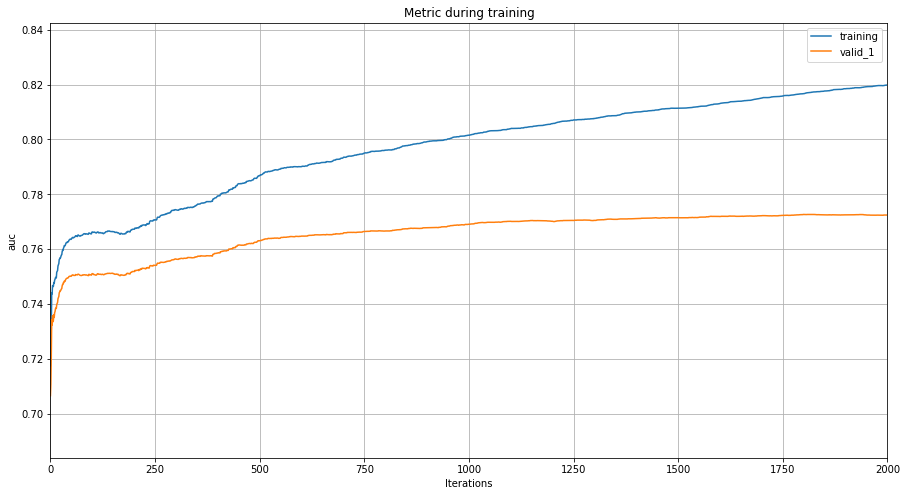

In [564]:
ax = lgb.plot_metric(evals_result, metric='auc', figsize=(15, 8))
plt.show()

In [327]:
for i in range(2):
    
    # Split into training and validation set
    train_features, valid_features, train_y, valid_y = train_test_split(X, y, test_size = 0.25, random_state = i)
    
    # Train using early stopping
    model.fit(train_features, train_y, early_stopping_rounds=150, eval_set = [(valid_features, valid_y)],eval_metric = 'auc', verbose = 200)
    
    # Record the feature importances
    feature_importances += model.feature_importances_

Training until validation scores don't improve for 150 rounds
Did not meet early stopping. Best iteration is:
[40]	valid_0's auc: 0.771708	valid_0's binary_logloss: 0.2541
Training until validation scores don't improve for 150 rounds
Did not meet early stopping. Best iteration is:
[50]	valid_0's auc: 0.766271	valid_0's binary_logloss: 0.255187


In [316]:
# Make sure to average feature importances! 
feature_importances = feature_importances / 2
feature_importances = pd.DataFrame({'feature': list(X.columns), 'importance': feature_importances}).sort_values('importance', ascending = False)
feature_importances.head()

,feature,importance
11,apache_2_diagnosis,1059.0
8,pre_icu_los_days,702.0
7,icu_id,574.5
3,age,562.5
4,bmi,450.0


# XGBOOST

### Étape 1. Recherche de n_estimators après avoir fixé d'autres paramètres

max_depth = 5: Cela devrait être compris entre 3 et 10. J'ai commencé avec 5, mais vous pouvez également choisir un nombre différent. 4-6 peut être un bon point de départ.

min_child_weight = 1: une valeur plus petite est choisie car il s'agit d'un problème de classe très déséquilibré et les nœuds terminaux peuvent avoir des groupes de taille plus petits.

gamma = 0: une valeur plus petite comme 0,1-0,2 peut également être choisie pour le démarrage. Ce sera de toute façon réglé plus tard.

sous-échantillon, colsample_bytree = 0,8: il s'agit d'une valeur de départ couramment utilisée. Les valeurs typiques vont de 0,5 à 0,9.

scale_pos_weight = 1: en raison d'un déséquilibre de classe élevé

In [349]:
# train_test split
X_train, X_eval, Y_train, Y_eval = train_test_split(X, y, test_size=0.15, stratify=y)
X_train.shape, X_eval.shape, Y_train.shape, Y_eval.shape

((56695, 51), (10005, 51), (56695,), (10005,))

In [353]:
# tuning tree specific features
gkf = KFold(n_splits=3, shuffle=True, random_state=42).split(X=X_train, y=Y_train)

fit_params_of_xgb = {
    "early_stopping_rounds":100, 
    "eval_metric" : 'auc', 
    "eval_set" : [(X_eval,Y_eval)],
    # 'callbacks': [lgb.reset_parameter(learning_rate=learning_rate_010_decay_power_099)],
    'verbose': 100,
}


# A parameter grid for XGBoost
params = {
    'booster': ["gbtree"],
    'learning_rate': [0.1],
    'n_estimators': range(100, 500, 100),
    'min_child_weight': [1],
    'gamma': [0],
    'subsample': [0.8],
    'colsample_bytree': [0.8],
    'max_depth': [5],
    "scale_pos_weight": [1]
}

xgb_estimator = XGBClassifier(
    objective='binary:logistic',
    # silent=True,
)

gsearch = GridSearchCV(
    estimator=xgb_estimator,
    param_grid=params,
    scoring='roc_auc',
    n_jobs=-1,
    cv=gkf, verbose=3
)

# gsearch = RandomizedSearchCV(
#     estimator=xgb_estimator,
#     param_distributions=params,
#     scoring='roc_auc',
#     n_jobs=-1,
#     cv=gkf, verbose=3
# )

xgb_model = gsearch.fit(X=X_train, y=Y_train, **fit_params_of_xgb)
gsearch.best_params_, gsearch.best_score_

Fitting 3 folds for each of 4 candidates, totalling 12 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  12 | elapsed:  2.8min remaining:   33.2s
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed:  3.0min finished


[0]	validation_0-auc:0.67498
Will train until validation_0-auc hasn't improved in 100 rounds.
[99]	validation_0-auc:0.77315


({'booster': 'gbtree',
  'colsample_bytree': 0.8,
  'gamma': 0,
  'learning_rate': 0.1,
  'max_depth': 5,
  'min_child_weight': 1,
  'n_estimators': 100,
  'scale_pos_weight': 1,
  'subsample': 0.8},
 0.7757189737642414)

In [448]:
gkf = KFold(n_splits=3, shuffle=True, random_state=42).split(X=X_train, y=Y_train)

fit_params_of_xgb = {
    "early_stopping_rounds":100, 
    "eval_metric" : 'auc', 
    "eval_set" : [(X_eval,Y_eval)],
    # 'callbacks': [lgb.reset_parameter(learning_rate=learning_rate_010_decay_power_099)],
    'verbose': 100,
}

# A parameter grid for XGBoost
params = {
    'booster': ["gbtree"],
    'learning_rate': [0.01],
    'n_estimators': range(1000, 6000, 1000),
    "scale_pos_weight": [1],
    'max_depth':[4],
    'min_child_weight': [6],
    'gamma': [0],
    'subsample': [0.4],
    'colsample_bytree': [0.8],
    'reg_alpha': [0.08]
}

xgb_estimator = XGBClassifier(
    objective='binary:logistic',
    silent=True,
)

gsearch = GridSearchCV(
    estimator=xgb_estimator,
    param_grid=params,
    scoring='roc_auc',
    n_jobs=-1,
    cv=gkf, verbose=3
)

xgb_model = gsearch.fit(X=X_train, y=Y_train, **fit_params_of_xgb)
gsearch.best_params_, gsearch.best_score_

Fitting 3 folds for each of 5 candidates, totalling 15 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


KeyboardInterrupt: 

In [435]:
params_for_fit = {
    "eval_metric":"auc", "eval_set": [(X_eval, Y_eval)],
    'early_stopping_rounds':500, 'verbose': 100
}
xgb_estimator = XGBClassifier(
    n_estimators=3000,
    objective='binary:logistic',
    booster="gbtree",
    learning_rate=0.01,
    scale_pos_weight=1,
    max_depth=4,
    min_child_weight=6,
    gamma=0,
    subsample=0.4,
    colsample_bytree=0.8,
    reg_alpha=0.08,
#         n_jobs=-1
)
xgb_estimator.fit(X=X_train, y=Y_train, **params_for_fit)

[0]	validation_0-auc:0.66399
Will train until validation_0-auc hasn't improved in 500 rounds.
[100]	validation_0-auc:0.73774
[200]	validation_0-auc:0.74257
[300]	validation_0-auc:0.75023
[400]	validation_0-auc:0.75454
[500]	validation_0-auc:0.75834
[600]	validation_0-auc:0.76216
[700]	validation_0-auc:0.76541
[800]	validation_0-auc:0.76730
[900]	validation_0-auc:0.76890
[1000]	validation_0-auc:0.76974
[1100]	validation_0-auc:0.77077
[1200]	validation_0-auc:0.77158
[1300]	validation_0-auc:0.77234
[1400]	validation_0-auc:0.77282
[1500]	validation_0-auc:0.77342
[1600]	validation_0-auc:0.77362
[1700]	validation_0-auc:0.77404
[1800]	validation_0-auc:0.77440
[1900]	validation_0-auc:0.77474
[2000]	validation_0-auc:0.77501
[2100]	validation_0-auc:0.77536
[2200]	validation_0-auc:0.77494
[2300]	validation_0-auc:0.77537
[2400]	validation_0-auc:0.77550
[2500]	validation_0-auc:0.77571
[2600]	validation_0-auc:0.77563
[2700]	validation_0-auc:0.77558
[2800]	validation_0-auc:0.77518
[2900]	validation_0

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=0.8, gamma=0, gpu_id=-1,
       importance_type='gain', interaction_constraints=None,
       learning_rate=0.01, max_delta_step=0, max_depth=4,
       min_child_weight=6, missing=nan, monotone_constraints=None,
       n_estimators=3000, n_jobs=0, num_parallel_tree=1,
       objective='binary:logistic', random_state=0, reg_alpha=0.08,
       reg_lambda=1, scale_pos_weight=1, subsample=0.4, tree_method=None,
       validate_parameters=False, verbosity=None)

# Voting Classifier


Un classificateur de vote est un modèle d'apprentissage automatique qui s'entraîne sur un ensemble de nombreux modèles et prédit une sortie (classe) en fonction de leur probabilité la plus élevée de classe choisie comme sortie.Il agrège simplement les résultats de chaque classificateur passé dans Voting Classifier et prédit la classe de sortie basée sur la plus grande majorité des votes.

Le classificateur de vote prend en charge deux types de votes.

Vote fort: en cas de vote dur, la classe de sortie prévue est une classe avec la plus grande majorité de votes, c'est-à-dire la classe qui avait la plus forte probabilité d'être prédite par chacun des classificateurs.

Vote doux: Dans le vote doux, la classe de sortie est la prédiction basée sur la moyenne de probabilité donnée à cette classe.

In [440]:
# Split into training and validation set
X_train, valid_features, Y_train, valid_y = train_test_split(X, y, test_size = 0.25, random_state = 1)

In [441]:
# Gradient Boosting Classifier
GBC = GradientBoostingClassifier(random_state=1)

In [442]:
# Random Forest Classifier
RFC = RandomForestClassifier(n_estimators=100)

In [443]:
# Voting Classifier with soft voting 
votingC = VotingClassifier(estimators=[('rfc', RFC),('gbc',GBC)], voting='soft')
votingC = votingC.fit(X_train, Y_train)

In [444]:
predict_y = votingC.predict(valid_features)

In [445]:
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

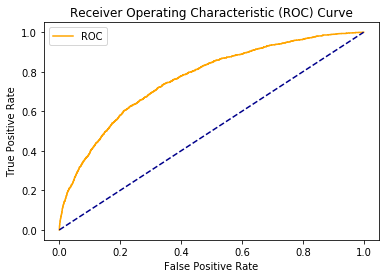

AUC-ROC : 0.7638217560550207


In [446]:
probs = votingC.predict_proba(valid_features)
probs = probs[:, 1]
auc = roc_auc_score(valid_y, probs)
fpr, tpr, thresholds = roc_curve(valid_y, probs)
plot_roc_curve(fpr, tpr)
print("AUC-ROC :",auc)

# TensorFlow

In [566]:
#Import TensorFlow into your program:
from __future__ import absolute_import, division, print_function, unicode_literals
# Install TensorFlow
import tensorflow as tf
from sklearn import preprocessing
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.callbacks import ModelCheckpoint
from keras.callbacks import Callback, EarlyStopping

In [567]:
x_train, x_test ,y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

### Rappels(callback):

Le rappel est une classe python destinée à être sous-classée pour fournir des fonctionnalités spécifiques, avec un ensemble de méthodes appelées à différentes étapes de la formation (y compris le début et la fin du lot / époque), les tests et les prévisions. Les rappels sont utiles pour obtenir une vue sur les états internes et les statistiques du modèle pendant la formation. Vous pouvez transmettre une liste de rappels (en tant qu'argument de mot clé rappels) à l'une des méthodes tf.keras.Model.fit (), tf.keras.Model.evaluate () et tf.keras.Model.predict (). Les méthodes des rappels seront ensuite appelées à différentes étapes de la formation / évaluation / inférence.

In [568]:
checkpoint_callback = ModelCheckpoint("model.h5", monitor='accuracy', save_best_only=True)

### Create Model

In [569]:
def build_model():
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(256, activation="relu", input_shape=[len(X.keys())],name='fc1'),
        tf.keras.layers.Dense(128, activation="relu", name='fc2'),
        tf.keras.layers.Dense(2, activation="softmax")
      ])
    optimizer = SGD(lr=0.1)
    # Minimisation de l'erreur
    model.compile(loss="sparse_categorical_crossentropy", optimizer="sgd", metrics=["accuracy"])
    
    return model

#model = Sequential()
#Ajout de layers
#model.add(tf.keras.layers.Dense(256, activation="relu", name='fc1'))
#model.add(tf.keras.layers.Dense(128, activation="relu", name='fc2'))
#model.add(tf.keras.layers.Dense(10, activation="softmax"))
#optimizer = SGD(lr=0.1)

In [570]:
model = build_model()

In [571]:
model.summary()

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
fc1 (Dense)                  (None, 256)               13312     
_________________________________________________________________
fc2 (Dense)                  (None, 128)               32896     
_________________________________________________________________
dense_26 (Dense)             (None, 2)                 258       
Total params: 46,466
Trainable params: 46,466
Non-trainable params: 0
_________________________________________________________________


In [572]:
#history = model.fit(x_train, y_train, verbose=0, epochs=50, validation_split=0.2, callbacks=[checkpoint_callback])
evals_result = {} 
model.fit(x_train, y_train, epochs=20)

Epoch 1/20
53360/53360 [==============================] - 5s 87us/sample - loss: 1335209.9088 - accuracy: 0.9090
Epoch 2/20
53360/53360 [==============================] - 3s 56us/sample - loss: 0.3711 - accuracy: 0.9117
Epoch 3/20
53360/53360 [==============================] - 3s 57us/sample - loss: 0.3283 - accuracy: 0.9117
Epoch 4/20
53360/53360 [==============================] - 3s 60us/sample - loss: 0.3124 - accuracy: 0.9117
Epoch 5/20
53360/53360 [==============================] - 3s 58us/sample - loss: 0.3055 - accuracy: 0.9117
Epoch 6/20
53360/53360 [==============================] - 4s 66us/sample - loss: 0.3022 - accuracy: 0.9117
Epoch 7/20
53360/53360 [==============================] - 3s 64us/sample - loss: 0.3006 - accuracy: 0.9117
Epoch 8/20
53360/53360 [==============================] - 3s 60us/sample - loss: 0.2997 - accuracy: 0.9117
Epoch 9/20
53360/53360 [==============================] - 3s 60us/sample - loss: 0.2992 - accuracy: 0.9117
Epoch 10/20
53360/53360 [======

In [573]:
test_loss, test_acc = model.evaluate(x_test,  y_test, verbose=2)

print('\nTest accuracy:', test_acc)

13340/13340 - 1s - loss: 0.2935 - accuracy: 0.9139

Test accuracy: 0.91386807


In [574]:
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

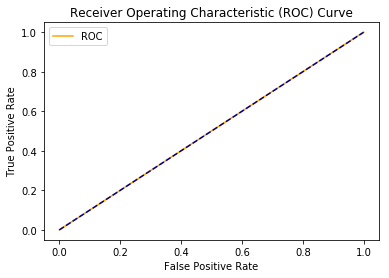

AUC-ROC : 0.5002870970387991


In [575]:
probs = model.predict_proba(x_test)
probs = probs[:, 1]
auc = roc_auc_score(y_test, probs)
fpr, tpr, thresholds = roc_curve(y_test, probs)
plot_roc_curve(fpr, tpr)
print("AUC-ROC :",auc)

In [576]:
ax = model.plot_metric(evals_result, metric='auc', figsize=(15, 8))
plt.show()

AttributeError: 'Sequential' object has no attribute 'plot_metric'

In [427]:
probability_model = tf.keras.Sequential([model, tf.keras.layers.Softmax()])

In [428]:
predictions = probability_model.predict(x_test)

In [434]:
predictions[0]

array([0.6949235 , 0.30507648], dtype=float32)